### Importacion de librerias

Importamos librerias principales

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
%config InlineBackend.figure_format = 'retina'

### Lectura de datos

Lectura de los datos y descripcion de los datos

In [3]:
data = pd.read_csv('/Users/gblasd/Documents/DataScience/03_UnsupervisedLearning/data/FIFA19-DS.csv')
data.shape

(17140, 76)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17140 entries, 0 to 17139
Data columns (total 76 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        17140 non-null  int64  
 1   Age                       17140 non-null  int64  
 2   Overall                   17140 non-null  int64  
 3   Potential                 17140 non-null  int64  
 4   Value                     17140 non-null  int64  
 5   Wage                      17140 non-null  int64  
 6   Special                   17140 non-null  int64  
 7   International Reputation  17140 non-null  int64  
 8   Weak Foot                 17140 non-null  int64  
 9   Skill Moves               17140 non-null  int64  
 10  Work Rate                 17140 non-null  int64  
 11  Height                    17140 non-null  float64
 12  Weight                    17140 non-null  int64  
 13  LS                        15298 non-null  float64
 14  ST    

In [5]:
data.describe(include='all', percentiles=[0.01, .25, .5, .75, .99])

,ID,Age,Overall,Potential,Value,Wage,Special,International Reputation,Weak Foot,Skill Moves,Work Rate,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Preferred Foot,Body Type,Position
count,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140.00,17140,17140,17140
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,3,6
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Right,Normal,DF
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13156,9990,5525
mean,214049.43,25.15,66.37,71.39,2486680.28,10007.53,1604.91,1.12,2.96,2.38,4.76,5.80,165.96,60.02,60.02,60.02,61.27,60.95,60.95,60.95,61.27,61.22,61.22,61.22,61.96,60.47,60.47,60.47,61.96,59.72,59.04,59.04,59.04,59.72,59.00,57.78,57.78,57.78,59.00,50.16,45.88,52.52,59.05,43.26,55.77,47.57,43.24,53.08,58.74,64.79,64.89,63.72,61.99,64.11,55.83,65.14,63.50,65.40,47.51,56.18,47.01,50.34,53.74,48.78,58.88,47.54,48.02,45.95,16.40,16.18,16.03,16.17,16.49,NaN,NaN,NaN
std,30013.91,4.66,6.93,6.16,5731964.36,22511.51,272.62,0.40,0.66,0.76,1.61,0.45,15.55,9.13,9.13,9.13,9.87,9.83,9.83,9.83,9.87,9.76,9.76,9.76,9.25,8.82,8.82,8.82,9.25,8.97,10.08,10.08,10.08,8.97,9.53,11.68,11.68,11.68,9.53,18.29,19.46,17.24,14.60,17.70,18.79,18.38,17.50,15.26,16.57,14.88,14.60,14.73,9.02,14.11,17.16,11.82,15.84,12.51,19.22,17.29,20.63,19.43,14.13,15.65,11.44,19.84,21.58,21.22,17.41,16.65,16.25,16.75,17.67,NaN,NaN,NaN
min,16.00,16.00,46.00,48.00,0.00,0.00,731.00,1.00,1.00,1.00,0.00,5.10,110.00,33.00,33.00,33.00,27.00,29.00,29.00,29.00,27.00,29.00,29.00,29.00,29.00,32.00,32.00,32.00,29.00,32.00,30.00,30.00,30.00,32.00,31.00,27.00,27.00,27.00,31.00,5.00,2.00,4.00,7.00,4.00,4.00,6.00,4.00,9.00,8.00,12.00,12.00,14.00,21.00,16.00,2.00,15.00,12.00,17.00,3.00,11.00,3.00,2.00,10.00,5.00,12.00,3.00,2.00,3.00,1.00,1.00,1.00,1.00,1.00,NaN,NaN,NaN
1%,110678.17,17.00,50.00,58.00,0.00,0.00,847.00,1.00,2.00,1.00,1.00,5.10,132.00,39.00,39.00,39.00,36.00,36.00,36.00,36.00,36.00,36.00,36.00,36.00,38.00,39.00,39.00,39.00,38.00,39.00,36.00,36.00,36.00,39.00,37.00,34.00,34.00,34.00,37.00,10.00,7.00,10.00,17.00,6.00,8.00,10.00,10.00,16.00,12.00,22.00,23.00,26.00,40.00,27.00,16.00,33.00,20.00,32.39,6.00,17.00,9.00,5.00,19.00,12.00,28.00,8.00,10.00,10.00,5.00,5.00,5.00,5.00,5.00,NaN,NaN,NaN
25%,199934.25,21.00,62

### Missing Values

Tenemos columnas con el 10.75% de valores con `NaN`.

Los registros con valores `NaN` pertencen a jugadores de la posicion `PK (Portero)`.

In [6]:
missing_values = pd.DataFrame(data.isnull().sum() / data.shape[0] * 100).sort_values(by=0)
missing_values.columns = ['missing_values']
missing_values[missing_values['missing_values'] > 0].T

,RS,ST,RB,LW,LS,LF,CF,RF,LCB,LB,RWB,RDM,CDM,LDM,LWB,CB,RM,CM,LCM,LM,RAM,CAM,LAM,RW,RCM,RCB
missing_values,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75,10.75


In [7]:
data.groupby('Position')['GKReflexes'].count()

Position
AM    1680
DF    5525
DM    1392
GK    1842
MF    4205
ST    2496
Name: GKReflexes, dtype: int64

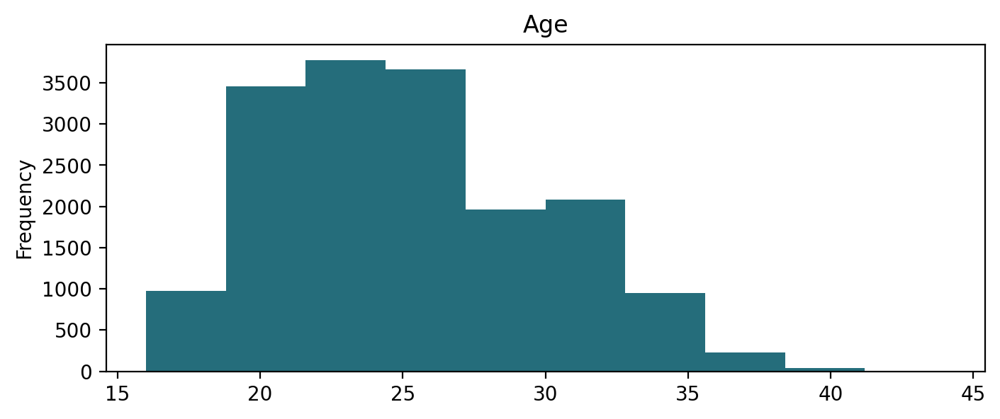

In [8]:
plt.figure(figsize=(8, 3))
data['Age'].plot(kind='hist', color='#256D7B')
plt.title('Age')
plt.show()

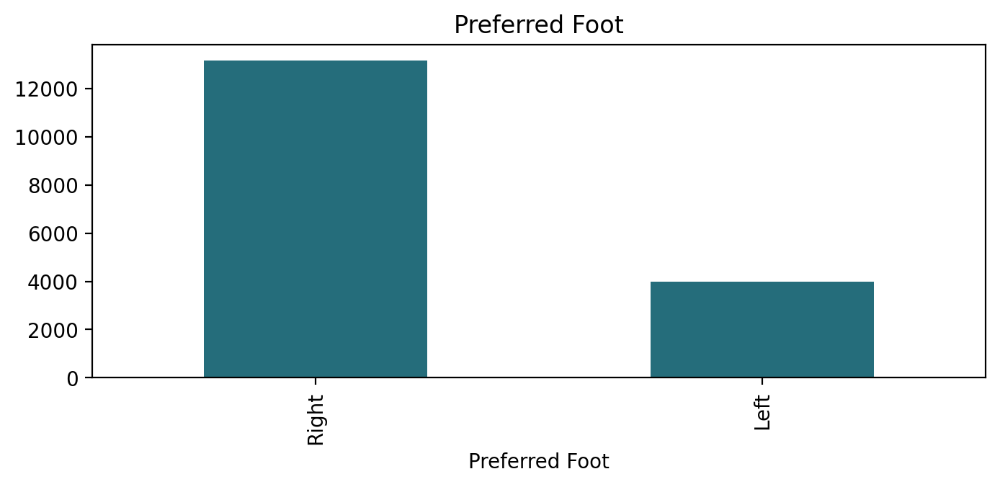

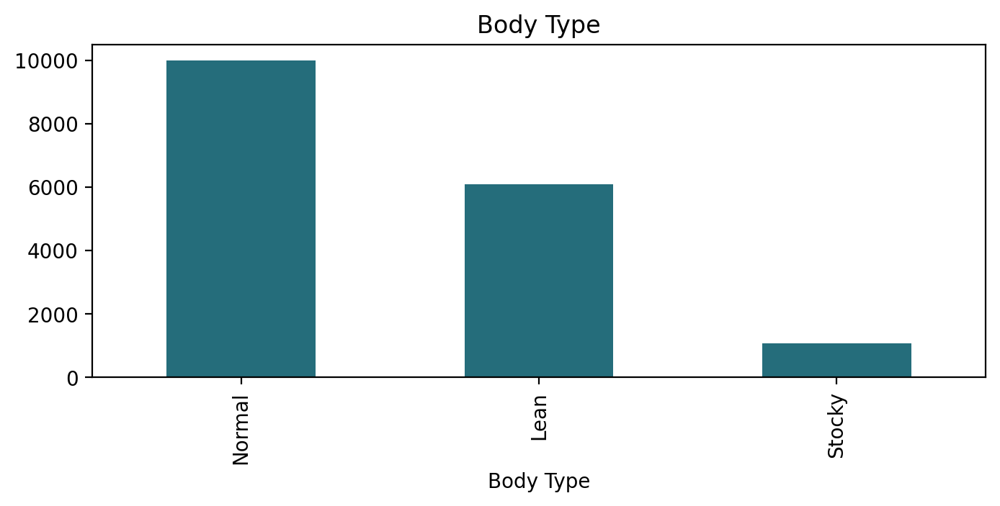

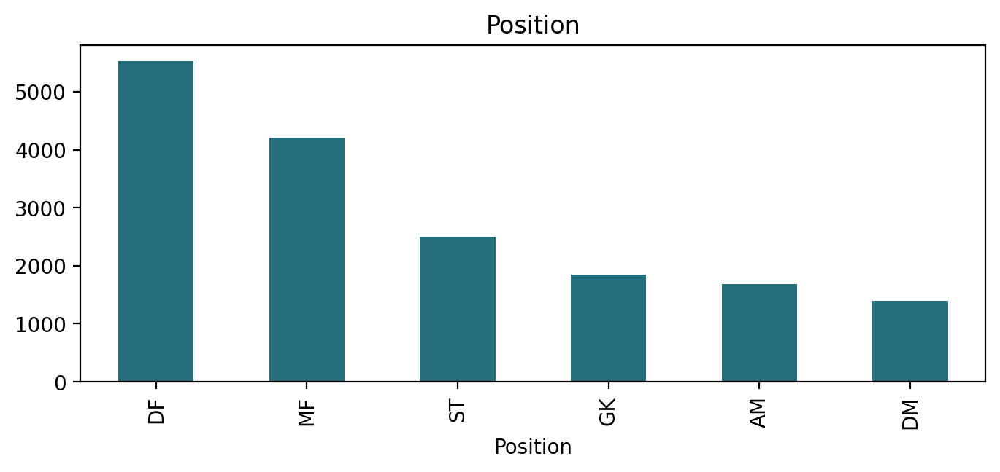

In [9]:
for x in data.select_dtypes(include='object'):
    plt.figure(figsize=(8, 3))
    data[x].value_counts().plot(kind='bar', color='#256D7B')
    plt.title(x)
    plt.show()

In [10]:
from sklearn.preprocessing import LabelEncoder

for x in data.select_dtypes(include='object'):
    print(x)
    le = LabelEncoder()
    le.fit(data[x])
    print(le.classes_)
    data[x] = le.transform(data[x])

Preferred Foot
['Left' 'Right']
Body Type
['Lean' 'Normal' 'Stocky']
Position
['AM' 'DF' 'DM' 'GK' 'MF' 'ST']


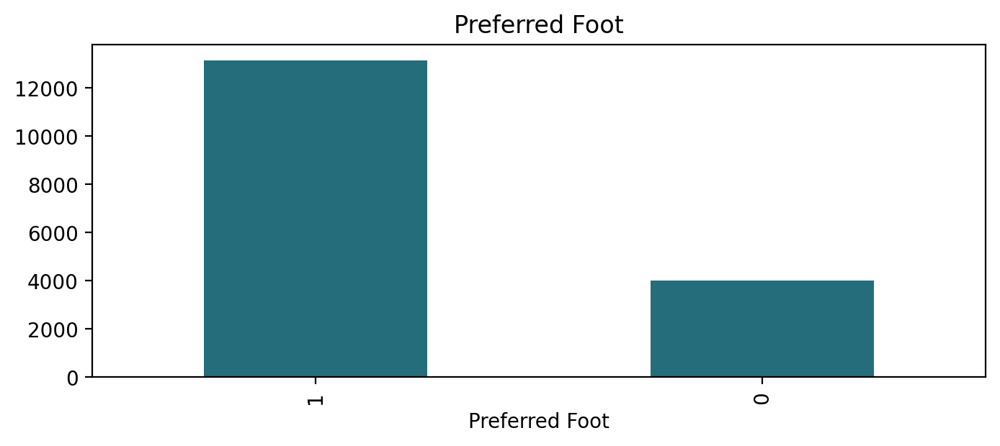

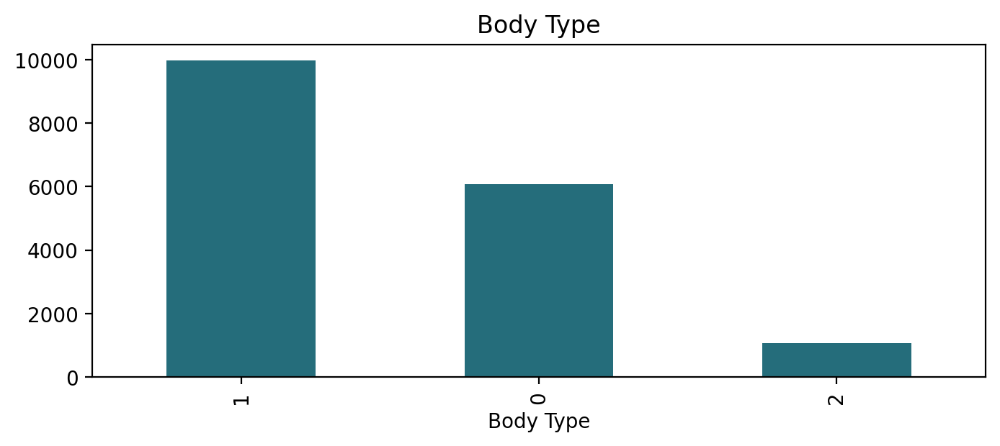

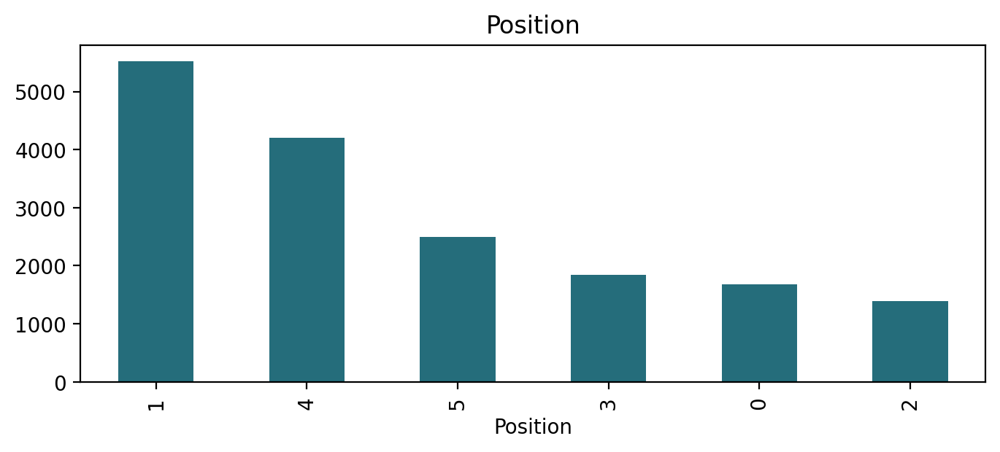

In [11]:
for x in data[['Preferred Foot', 'Body Type', 'Position']]:
    plt.figure(figsize=(8, 3))
    data[x].value_counts().plot(kind='bar', color='#256D7B')
    plt.title(x)
    plt.show()

In [12]:
data.columns

Index(['ID', 'Age', 'Overall', 'Potential', 'Value', 'Wage', 'Special',
       'International Reputation', 'Weak Foot', 'Skill Moves', 'Work Rate',
       'Height', 'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
       'GKKicking', 'GKPositioning', 'GKReflexes', 'Preferred Foot',
       'Body Type', 'Position'],
      dtype='object')

In [13]:
columns = [_ for _ in data.columns.to_list() if _ not in ['ID']]
data[columns].columns

Index(['Age', 'Overall', 'Potential', 'Value', 'Wage', 'Special',
       'International Reputation', 'Weak Foot', 'Skill Moves', 'Work Rate',
       'Height', 'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
       'GKKicking', 'GKPositioning', 'GKReflexes', 'Preferred Foot',
       'Body Type', 'Position'],
      dtype='object')

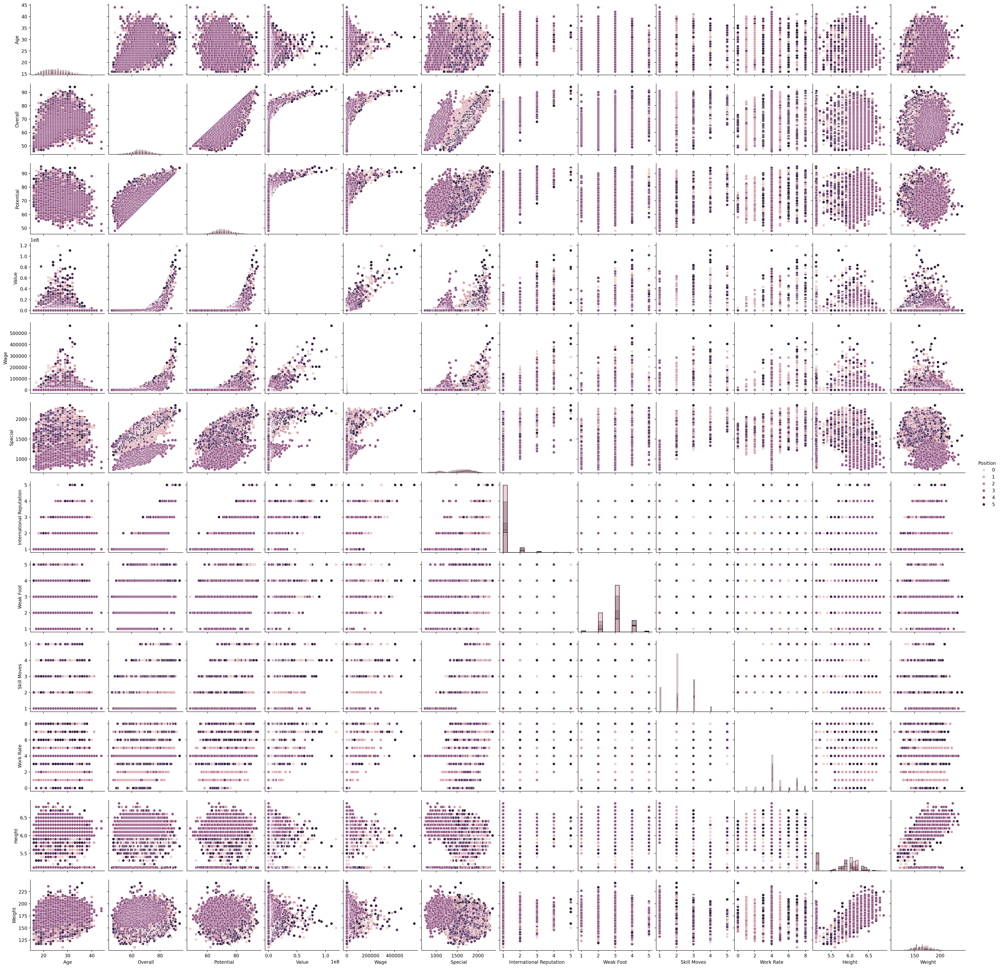

In [14]:
sns.pairplot(data[['Age', 'Overall', 'Potential', 'Value', 'Wage', 'Special',
       'International Reputation', 'Weak Foot', 'Skill Moves', 'Work Rate',
       'Height', 'Weight',
       'Position']], 
       plot_kws={'color': '#256D7B'},
       diag_kind='hist',
       hue='Position')
plt.show()

In [16]:
data[['Position']].value_counts()

Position
1           5525
4           4205
5           2496
3           1842
0           1680
2           1392
Name: count, dtype: int64

In [20]:
aux = data[data['Position'] == 3][['Age', 'Overall', 'Potential', 'Value', 'Wage', 'Special',
       'International Reputation', 'Weak Foot', 'Skill Moves', 'Work Rate',
       'Height', 'Weight',
       'Position',
       'GKDiving', 'GKHandling','GKKicking', 'GKPositioning', 'GKReflexes' # portero 
       ]]

# grafica
sns.pairplot(aux)
plt.show()

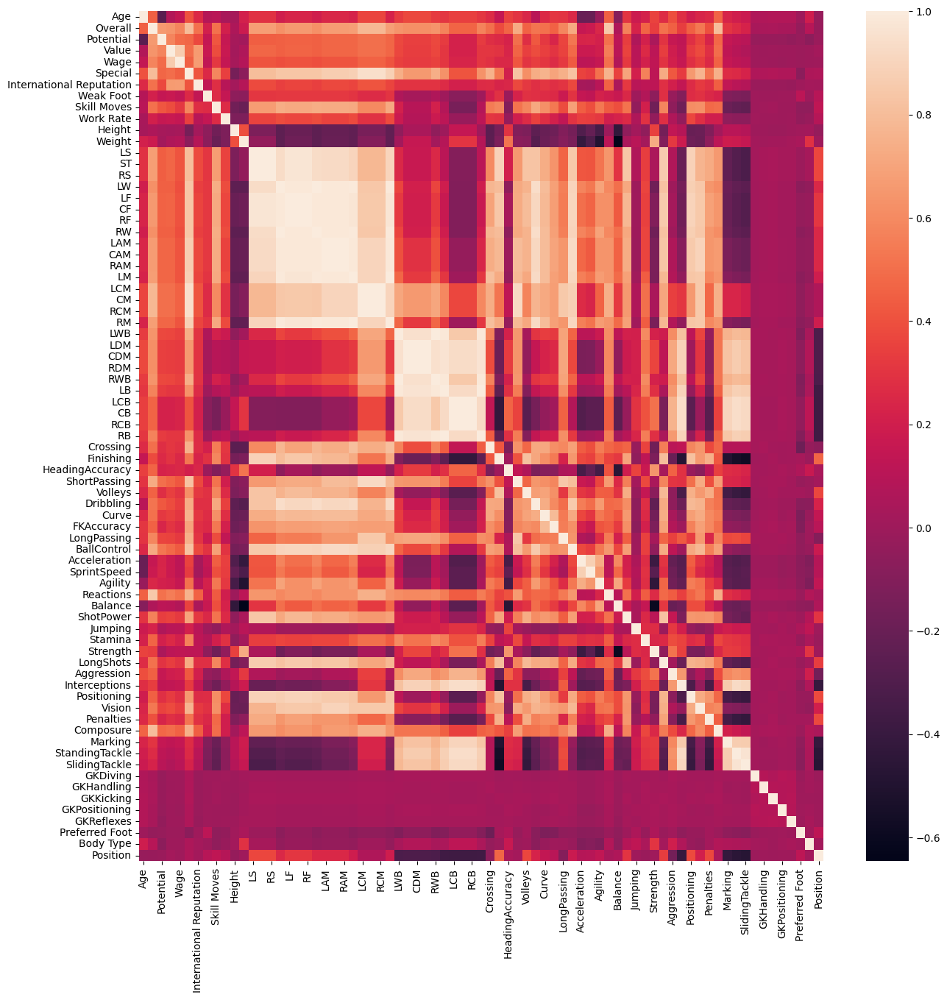

In [143]:
plt.figure(figsize=(15,15))
sns.heatmap(data[columns].corr())
plt.show()

In [144]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
data[['ss_' + i for i in columns]] = ss.fit_transform(data[columns])
ss_columns = data.filter(like='ss_').columns.to_list()
data[ss_columns].head()

,ss_Age,ss_Overall,ss_Potential,ss_Value,ss_Wage,ss_Special,ss_International Reputation,ss_Weak Foot,ss_Skill Moves,ss_Work Rate,ss_Height,ss_Weight,ss_LS,ss_ST,ss_RS,ss_LW,ss_LF,ss_CF,ss_RF,ss_RW,ss_LAM,ss_CAM,ss_RAM,ss_LM,ss_LCM,ss_CM,ss_RCM,ss_RM,ss_LWB,ss_LDM,ss_CDM,ss_RDM,ss_RWB,ss_LB,ss_LCB,ss_CB,ss_RCB,ss_RB,ss_Crossing,ss_Finishing,ss_HeadingAccuracy,ss_ShortPassing,ss_Volleys,ss_Dribbling,ss_Curve,ss_FKAccuracy,ss_LongPassing,ss_BallControl,ss_Acceleration,ss_SprintSpeed,ss_Agility,ss_Reactions,ss_Balance,ss_ShotPower,ss_Jumping,ss_Stamina,ss_Strength,ss_LongShots,ss_Aggression,ss_Interceptions,ss_Positioning,ss_Vision,ss_Penalties,ss_Composure,ss_Marking,ss_StandingTackle,ss_SlidingTackle,ss_GKDiving,ss_GKHandling,ss_GKKicking,ss_GKPositioning,ss_GKReflexes,ss_Preferred Foot,ss_Body Type,ss_Position
0,1.31,4.03,3.68,18.50,24.08,2.69,9.63,1.55,2.35,-0.51,-0.12,-0.35,3.28,3.28,3.28,3.32,3.46,3.46,3.46,3.32,3.46,3.46,3.46,3.36,2.90,2.90,2.90,3.36,0.70,0.39,0.39,0.39,0.70,0.21,-0.75,-0.75,-0.75,0.21,2.09,2.76,1.11,2.78,2.63,2.90,2.74,3.13,2.48,3.26,1.96,1.56,1.99,3.72,2.33,1.91,0.17,0.40,-0.56,2.69,-0.82,-1.53,2.66,2.97,1.82,3.49,-1.07,-1.26,-1.24,-1.46,0.14,1.41,1.12,-0.81,-1.74,-1.19,1.51
1,1.75,4.03,3.68,12.76,17.13,2.82,9.63,1.55,3.96,0.69,1.02,1.27,3.72,3.72,3.72,3.11,3.26,3.26,3.26,3.11,3.05,3.05,3.05,3.14,2.67,2.67,2.67,3.14,0.92,0.49,0.49,0.49,0.92,0.53,-0.15,-0.15,-0.15,0.53,2.09,2.70,2.75,1.86,2.70,2.18,1.94,1.94,1.67,3.06,1.79,2.00,1.66,3.84,0.28,2.66,2.51,1.83,1.04,2.63,0.22,-1.15,2.73,2.04,2.62,3.39,-1.36,-1.10,-1.40,-1.13,0.14,1.41,1.12,0.16,0.57,0.53,1.51
2,0.21,3.74,3.51,19.88,12.14,2.39,9.63,3.11,3.96,1.28,0.34,-0.96,2.96,2.96,2.96,3.11,3.16,3.16,3.16,3.11,3.15,3.15,3.15,3.14,2.67,2.67,2.67,3.14,0.92,0.39,0.39,0.39,0.92,0.42,-0.67,-0.67,-0.67,0.42,1.74,2.27,0.42,2.17,2.50,2.82,2.41,2.67,1.75,3.16,2.22,1.91,2.39,3.61,1.43,1.53,-0.44,1.21,-1.35,1.93,-0.26,-0.78,2.32,2.42,2.30,3.29,-1.42,-1.47,-0.88,-0.49,-0.51,1.41,1.45,0.16,0.57,-1.19,-1.54
3,0.43,3.59,3.35,17.05,14.96,3.09,7.15,3.11,2.35,1.88,-1.45,-0.69,2.74,2.74,2.74,2.91,2.95,2.95,2.95,2.91,3.05,3.05,3.05,3.14,3.35,3.35,3.35,3.14,2.26,2.08,2.08,2.08,2.26,1.78,0.96,0.96,0.96,1.78,2.73,1.96,-0.18,2.99,2.36,2.02,2.21,2.40,2.81,2.76,0.85,0.69,1.01,3.27,0.85,2.36,-0.27,2.01,0.72,2.50,1.13,0.55,2.18,2.97,2.14,2.70,0.96,0.31,0.06,1.45,0.79,-1.77,-0.17,0.80,0.57,0.53,0.75
4,0.43,3.59,3.19,15.50,14.31,2.39,7.15,1.55,2.35,1.28,0.11,-0.08,2.85,2.85,2.85,3.11,3.06,3.06,3.06,3.11,3.15,3.15,3.15,3.25,2.78,2.78,2.78,3.25,1.03,0.69,0.69,0.69,1.03,0.42,-0.50,-0.50,-0.50,0.42,1.88,2.08,0.33,2.68,2.23,2.74,2.08,2.14,2.16,3.06,2.22,1.74,2.31,3.15,2.25,1.68,-0.87,1.39,0.00,1.80,-0.40,-0.51,2.18,2.58,2.70,3.00,-1.02,-1.31,-1.45,0.16,0.47,-1.45,-0.82,-0.81,0.57,0.53,1.51


In [145]:
data[ss_columns].describe()

,ss_Age,ss_Overall,ss_Potential,ss_Value,ss_Wage,ss_Special,ss_International Reputation,ss_Weak Foot,ss_Skill Moves,ss_Work Rate,ss_Height,ss_Weight,ss_LS,ss_ST,ss_RS,ss_LW,ss_LF,ss_CF,ss_RF,ss_RW,ss_LAM,ss_CAM,ss_RAM,ss_LM,ss_LCM,ss_CM,ss_RCM,ss_RM,ss_LWB,ss_LDM,ss_CDM,ss_RDM,ss_RWB,ss_LB,ss_LCB,ss_CB,ss_RCB,ss_RB,ss_Crossing,ss_Finishing,ss_HeadingAccuracy,ss_ShortPassing,ss_Volleys,ss_Dribbling,ss_Curve,ss_FKAccuracy,ss_LongPassing,ss_BallControl,ss_Acceleration,ss_SprintSpeed,ss_Agility,ss_Reactions,ss_Balance,ss_ShotPower,ss_Jumping,ss_Stamina,ss_Strength,ss_LongShots,ss_Aggression,ss_Interceptions,ss_Positioning,ss_Vision,ss_Penalties,ss_Composure,ss_Marking,ss_StandingTackle,ss_SlidingTackle,ss_GKDiving,ss_GKHandling,ss_GKKicking,ss_GKPositioning,ss_GKReflexes,ss_Preferred Foot,ss_Body Type,ss_Position
count,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00,15298.00
mean,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-1.99,-3.03,-3.86,-0.44,-0.45,-3.42,-0.30,-3.15,-0.87,-2.89,-1.47,-3.67,-2.96,-2.96,-2.96,-3.47,-3.25,-3.25,-3.25,-3.47,-3.30,-3.30,-3.30,-3.56,-3.23,-3.23,-3.23,-3.56,-3.09,-2.88,-2.88,-2.88,-3.09,-2.94,-2.64,-2.64,-2.64,-2.94,-3.08,-2.45,-3.63,-4.39,-2.50,-3.76,-2.67,-2.43,-3.03,-3.85,-4.09,-3.76,-3.55,-4.72,-3.68,-3.47,-3.31,-3.62,-3.27,-2.59,-3.25,-2.17,-3.01,-3.39,-3.22,-3.79,-2.41,-2.20,-2.08,-3.07,-3.11,-3.04,-3.09,-3.06,-1.74,-1.19,-1.54
25%,-0.89,-0.68,-0.75,-0.38,-0.41,-0.71,-0.30,-0.02,-0.87,-0.51,-1.45,-0.69,-0.66,-0.66,-0.66,-0.61,-0.60,-0.60,-0.60,-0.61,-0.64,-0.64,-0.64,-0.65,-0.62,-0.62,-0.62,-0.65,-0.64,-0.70,-0.70,-0.70,-0.64,-0.73,-0.84,-0.84,-0.84,-0.73,-0.67,-0.85,-0.70,-0.60,-0.81,-0.47,-0.76,-0.84,-0.60,-0.54,-0.51,-0.53,-0.62,-0.73,-0.55,-0.59,-0.61,-0.58,-0.56,-0.75,-0.68,-0.83,-0.55,-0.68,-0.74,-0.64,-0.78,-0.89,-0.93,-0.81,-0.83,-0.81,-0.82,-0.81,0.57,-1.19,-0.78
50%,-0.01,0.06,-0.09,-0.32,-0.32,0.02,-0.30,-0.02,-0.87,-0.51,0.34,-0.08,0.11,0.11,0.11,0.07,0.11,0.11,0.11,0.07,0.08,0.08,0.08,0.11,0.06,0.06,0.06,0.11,0.03,0.10,0.10,0.10,0.03,0.11,0.19,0.19,0.19,0.11,0.18,0.19,0.08,0.12,0.00,0.17,0.03,-0.15,0.13,0.06,0.09,0.08,0.12,0.07,0.11,0.16,0.08,0.05,0.08,0.15,0.09,0.29,0.20,0.10,-0.02,0.05,0.27,0.36,0.32,-0.17,0.14,0.14,0.15,-0.17,0.57,0.53,-0.02
75%,0.65,0.65,0.56,-0.05,-0.02,0.70,-0.30,-0.02,0.74,1.28,0.79,0.66,0.66,0.66,0.66,0.68,0.72,0.72,0.72,0.68,0.69,0.69,0.69,0.65,0.63,0.63,0.63,0.65,0.70,0.69,0.69,0.69,0.70,0.73,0.79,0.79,0.79,0.73,0.75,0.80,0.68,0.63,0.74,0.66,0.76,0.81,0.70,0.66,0.68,0.69,0.68,0.64,0.69,0.77,0.69,0.67,0.72,0.78,0.71,0.77,0.75,0.72,0.78,0.73,0.79,0.78,0.80,0.80,0.79,0.78,0.80,0.80,0.57,0.53,0.75
max,3.51,4.03,3.84,19.88,24.08,

In [147]:
data[ss_columns].info()

<class 'pandas.core.frame.DataFrame'>
Index: 15298 entries, 0 to 15297
Data columns (total 75 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ss_Age                       15298 non-null  float64
 1   ss_Overall                   15298 non-null  float64
 2   ss_Potential                 15298 non-null  float64
 3   ss_Value                     15298 non-null  float64
 4   ss_Wage                      15298 non-null  float64
 5   ss_Special                   15298 non-null  float64
 6   ss_International Reputation  15298 non-null  float64
 7   ss_Weak Foot                 15298 non-null  float64
 8   ss_Skill Moves               15298 non-null  float64
 9   ss_Work Rate                 15298 non-null  float64
 10  ss_Height                    15298 non-null  float64
 11  ss_Weight                    15298 non-null  float64
 12  ss_LS                        15298 non-null  float64
 13  ss_ST                

In [149]:
data[ss_columns]

,ss_Age,ss_Overall,ss_Potential,ss_Value,ss_Wage,ss_Special,ss_International Reputation,ss_Weak Foot,ss_Skill Moves,ss_Work Rate,ss_Height,ss_Weight,ss_LS,ss_ST,ss_RS,ss_LW,ss_LF,ss_CF,ss_RF,ss_RW,ss_LAM,ss_CAM,ss_RAM,ss_LM,ss_LCM,ss_CM,ss_RCM,ss_RM,ss_LWB,ss_LDM,ss_CDM,ss_RDM,ss_RWB,ss_LB,ss_LCB,ss_CB,ss_RCB,ss_RB,ss_Crossing,ss_Finishing,ss_HeadingAccuracy,ss_ShortPassing,ss_Volleys,ss_Dribbling,ss_Curve,ss_FKAccuracy,ss_LongPassing,ss_BallControl,ss_Acceleration,ss_SprintSpeed,ss_Agility,ss_Reactions,ss_Balance,ss_ShotPower,ss_Jumping,ss_Stamina,ss_Strength,ss_LongShots,ss_Aggression,ss_Interceptions,ss_Positioning,ss_Vision,ss_Penalties,ss_Composure,ss_Marking,ss_StandingTackle,ss_SlidingTackle,ss_GKDiving,ss_GKHandling,ss_GKKicking,ss_GKPositioning,ss_GKReflexes,ss_Preferred Foot,ss_Body Type,ss_Position
0,1.31,4.03,3.68,18.50,24.08,2.69,9.63,1.55,2.35,-0.51,-0.12,-0.35,3.28,3.28,3.28,3.32,3.46,3.46,3.46,3.32,3.46,3.46,3.46,3.36,2.90,2.90,2.90,3.36,0.70,0.39,0.39,0.39,0.70,0.21,-0.75,-0.75,-0.75,0.21,2.09,2.76,1.11,2.78,2.63,2.90,2.74,3.13,2.48,3.26,1.96,1.56,1.99,3.72,2.33,1.91,0.17,0.40,-0.56,2.69,-0.82,-1.53,2.66,2.97,1.82,3.49,-1.07,-1.26,-1.24,-1.46,0.14,1.41,1.12,-0.81,-1.74,-1.19,1.51
1,1.75,4.03,3.68,12.76,17.13,2.82,9.63,1.55,3.96,0.69,1.02,1.27,3.72,3.72,3.72,3.11,3.26,3.26,3.26,3.11,3.05,3.05,3.05,3.14,2.67,2.67,2.67,3.14,0.92,0.49,0.49,0.49,0.92,0.53,-0.15,-0.15,-0.15,0.53,2.09,2.70,2.75,1.86,2.70,2.18,1.94,1.94,1.67,3.06,1.79,2.00,1.66,3.84,0.28,2.66,2.51,1.83,1.04,2.63,0.22,-1.15,2.73,2.04,2.62,3.39,-1.36,-1.10,-1.40,-1.13,0.14,1.41,1.12,0.16,0.57,0.53,1.51
2,0.21,3.74,3.51,19.88,12.14,2.39,9.63,3.11,3.96,1.28,0.34,-0.96,2.96,2.96,2.96,3.11,3.16,3.16,3.16,3.11,3.15,3.15,3.15,3.14,2.67,2.67,2.67,3.14,0.92,0.39,0.39,0.39,0.92,0.42,-0.67,-0.67,-0.67,0.42,1.74,2.27,0.42,2.17,2.50,2.82,2.41,2.67,1.75,3.16,2.22,1.91,2.39,3.61,1.43,1.53,-0.44,1.21,-1.35,1.93,-0.26,-0.78,2.32,2.42,2.30,3.29,-1.42,-1.47,-0.88,-0.49,-0.51,1.41,1.45,0.16,0.57,-1.19,-1.54
3,0.43,3.59,3.35,17.05,14.96,3.09,7.15,3.11,2.35,1.88,-1.45,-0.69,2.74,2.74,2.74,2.91,2.95,2.95,2.95,2.91,3.05,3.05,3.05,3.14,3.35,3.35,3.35,3.14,2.26,2.08,2.08,2.08,2.26,1.78,0.96,0.96,0.96,1.78,2.73,1.96,-0.18,2.99,2.36,2.02,2.21,2.40,2.81,2.76,0.85,0.69,1.01,3.27,0.85,2.36,-0.27,2.01,0.72,2.50,1.13,0.55,2.18,2.97,2.14,2.70,0.96,0.31,0.06,1.45,0.79,-1.77,-0.17,0.80,0.57,0.53,0.75
4,0.43,3.59,3.19,15.50,14.31,2.39,7.15,1.55,2.35,1.28,0.11,-0.08,2.85,2.85,2.85,3.11,3.06,3.06,3.06,3.11,3.15,3.15,3.15,3.25,2.78,2.78,2.78,3.25,1.03,0.69,0.69,0.69,1.03,0.42,-0.50,-0.50,-0.50,0.42,1.88,2.08,0.33,2.68,2.23,2.74,2.08,2.14,2.16,3.06,2.22,1.74,2.31,3.15,2.25,1.68,-0.87,1.39,0.00,1.80,-0.40,-0.51,2.18,2.58,2.70,3.00,-1.02,-1.31,-1.45,0.16,0.47,-1.45,-0.82,-0.81,0.57,0.53,1.51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15293,-1.55,-2.88,-0.59,-0.43,-0.41,-2.92,-0.30,-0.02,-0.87,-0.51,0.79,0.26,-2.85,-2.85,-2.85,-3.07,-2.94,-2.94,-2.94,-3.07,-3.20,-3.20,-3.20,-3.24,-3.23,-3.23,-3.23,-3.24,-2.09,-1.89,-1.89,-1.89,-2.09,-1.57,-0.84,-0.84,-0.84,-1.57,-2.30,-1.65,-1.04,-3.88,-1.35,-3.19,-2.02,-1.30,-2.38,-3.15,-1.36,-1.40,-2.24,-2.21,-1.54,-1.58,0.69,-2.55,-1.11,-2.27,-1.09,-0.30,-2.40,-1.92,-1.14,-1.72,-0.43,-0.27,0.17,-0.49,-0.18,-0.49,0.15,0.80,-1.74,-1.19,-0.78
15294,-1.33,-2.88,-1.41,-0.43,-0.41,-2.92,-0.30,-1.59,-0.87,-0.51,1.24,0.39,-1.43,-1.43,-1.43,-2.05,-1.72,-1.72,-1.72,-2.05,-1.97,-1.97,-1.97,-2.38,-2.66,-2.66,-2.66,-2.38,-3.09,-2.58,-2.58,-2.58,-3.09,-2.94,-2.04,-2.04,-2.04,-2.94,-2.23,0.12,-0.44,-2.04,-0.74,-1.75,-1.29,-1.77,-2.54,-2.34,-2.30,-2.53,-2.33,-2.55,-1.21,-1.43,-1.66,-2.19,0.08,-0.62,-0.89,-1.85,-0.62,-1.76,-0.74,-1.82,-1.71,-1.94,-1.61,-0.17,-0.51,-0.49,-1.79,0.48,0.57,0.53,1.51
15295,-1.99,-2.88,-0.75,

In [155]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)

pca = pca.fit( data[ss_columns] )

print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

pca = PCA(n_components=2, svd_solver='full')
pca.fit_transform( data[ss_columns] )

[30.38144951 16.13628392  4.48477474]
[0.40505951 0.21513639 0.05979309]


array([[ 22.76108051,  -2.72827092],
       [ 21.07947118,  -1.44538474],
       [ 20.66388465,  -2.62915655],
       ...,
       [-10.88139042,  -8.19395823],
       [-10.19516214,  -7.52675586],
       [ -9.25680307,  -1.90503556]], shape=(15298, 2))

In [158]:
df

,ID,Age,Overall,Potential,Value,Wage,Special,International Reputation,Weak Foot,Skill Moves,Work Rate,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Preferred Foot,Body Type,Position
0,158023,31,94,94,110500000,565000,2202,5,4,4,4,5.70,159,90.00,90.00,90.00,94.00,95.00,95.00,95.00,94.00,95.00,95.00,95.00,93.00,86.00,86.00,86.00,93.00,66.00,63.00,63.00,63.00,66.00,61.00,49.00,49.00,49.00,61.00,84,95,70,90,86,97,93,94,87,96,91,86,91,95,95,85,68,72,59,94,48,22,94,94,75,96,33,28,26,6,11,15,14,8,Left,Lean,ST
1,20801,33,94,94,77000000,405000,2228,5,4,5,6,6.20,183,94.00,94.00,94.00,92.00,93.00,93.00,93.00,92.00,91.00,91.00,91.00,91.00,84.00,84.00,84.00,91.00,68.00,64.00,64.00,64.00,68.00,64.00,56.00,56.00,56.00,64.00,84,94,89,81,87,88,81,76,77,94,89,91,87,96,70,95,95,88,79,93,63,29,95,82,85,95,28,31,23,7,11,15,14,11,Right,Normal,ST
2,190871,26,92,93,118500000,290000,2143,5,5,5,7,5.90,150,87.00,87.00,87.00,92.00,92.00,92.00,92.00,92.00,92.00,92.00,92.00,91.00,84.00,84.00,84.00,91.00,68.00,63.00,63.00,63.00,68.00,63.00,50.00,50.00,50.00,63.00,79,87,62,84,84,96,88,87,78,95,94,90,96,94,84,80,61,81,49,82,56,36,89,87,81,94,27,24,33,9,9,15,15,11,Right,Lean,AM
3,192985,27,91,92,102000000,355000,2281,4,5,4,8,5.11,154,85.00,85.00,85.00,90.00,90.00,90.00,90.00,90.00,91.00,91.00,91.00,91.00,90.00,90.00,90.00,91.00,80.00,80.00,80.00,80.00,80.00,76.00,69.00,69.00,69.00,76.00,93,82,55,92,82,86,85,83,91,91,78,76,79,91,77,91,63,90,75,91,76,61,87,94,79,88,68,58,51,15,13,5,10,13,Right,Normal,MF
4,183277,27,91,91,93000000,340000,2142,4,4,4,7,5.80,163,86.00,86.00,86.00,92.00,91.00,91.00,91.00,92.00,92.00,92.00,92.00,92.00,85.00,85.00,85.00,92.00,69.00,66.00,66.00,66.00,69.00,63.00,52.00,52.00,52.00,63.00,81,84,61,89,80,95,83,79,83,94,94,88,95,90,94,82,56,83,66,80,54,41,87,89,86,91,34,27,22,11,12,6,8,8,Right,Normal,ST
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17135,243158,18,48,65,50000,1000,738,1,2,1,4,6.00,176,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,7,11,22,6,8,10,8,20,12,24,28,33,40,29,15,48,20,38,6,20,10,7,18,12,28,16,11,10,47,46,50,45,51,Right,Lean,GK
17136,221669,22,48,58,40000,1000,987,1,2,1,4,6.10,172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19,15,15,26,14,13,12,19,19,25,40,42,45,47,52,25,55,33,58,20,20,29,13,20,29,28,12,15,16,45,49,50,50,45,Right,Lean,GK
17137,53748,44,48,48,0,1000,774,1,2,1,4,6.20,190,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,12,12,18,11,11,12,13,13,16,15,17,31,48,31,23,45,22,44,12,24,15,10,11,22,56,15,15,13,45,48,44,49,46,Right,Normal,GK
17138,245862,18,47,65,50000,1000,731,1,3,1,4,6.30,187,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,6,10,25,6,12,13,10,20,17,20,14,39,37,22,22,33,15,59,5,17,5,3,28,16,23,6,10,11,52,52,52,40,44,Right,Normal,GK


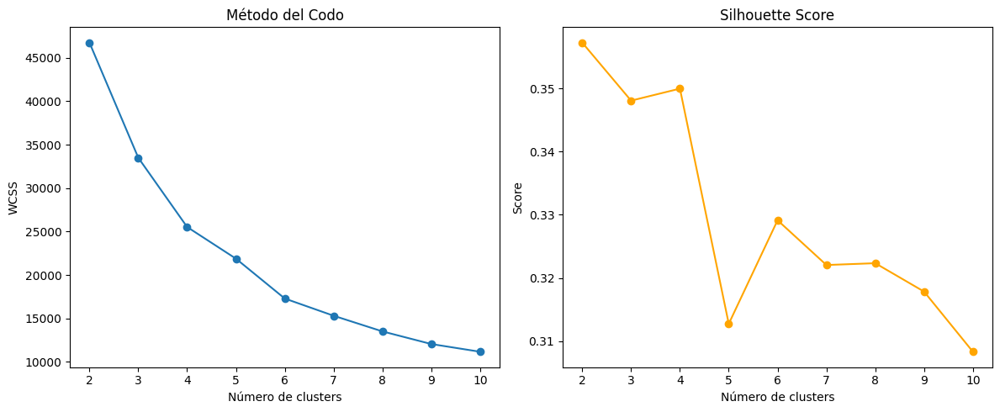

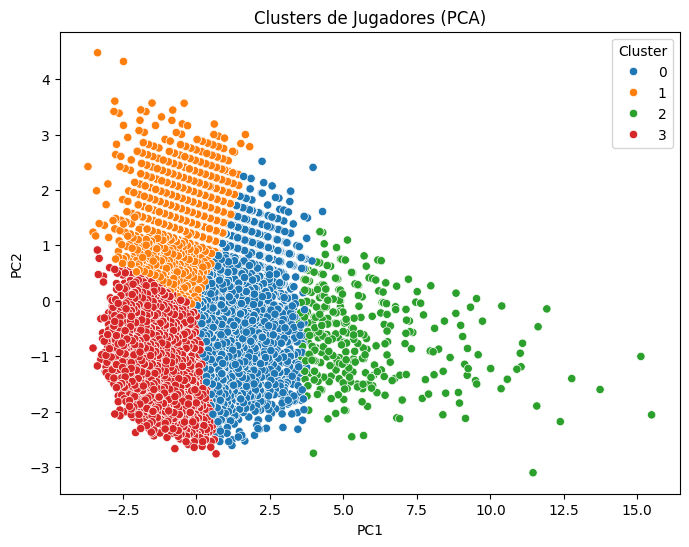

          Age  Overall  Potential       Value
Cluster                                      
0       25.17    72.94      77.22  4975510.75
1       29.32    66.44      67.05   752263.40
2       26.16    83.21      85.74 30635467.98
3       20.89    60.11      70.28   414055.46


In [159]:
# =======================
# 1. Cargar y explorar datos
# =======================
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# Cargar dataset
df = pd.read_csv("/Users/gblasd/Documents/DataScience/03_UnsupervisedLearning/data/FIFA19-DS.csv")  # Cambia el nombre si es otro formato

# =======================
# 2. Selección de variables relevantes
# =======================
features = [
    'Age', 'Overall', 'Potential', 'Value'
]

# Eliminar jugadores con datos faltantes en estas columnas
df = df[features].dropna()

# =======================
# 3. Estandarización
# =======================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df)

# =======================
# 4. Reducir dimensiones para visualizar
# =======================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# =======================
# 5. Determinar número óptimo de clusters
# =======================
wcss = []
silhouettes = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(X_scaled, kmeans.labels_))

# Graficar método del codo y silueta
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(range(2, 11), wcss, marker='o')
plt.title("Método del Codo")
plt.xlabel("Número de clusters")
plt.ylabel("WCSS")

plt.subplot(1,2,2)
plt.plot(range(2, 11), silhouettes, marker='o', color='orange')
plt.title("Silhouette Score")
plt.xlabel("Número de clusters")
plt.ylabel("Score")

plt.tight_layout()
plt.show()

# =======================
# 6. Agrupar jugadores
# =======================
k_opt = 4  # Cambia según los gráficos anteriores
kmeans = KMeans(n_clusters=k_opt, random_state=42)
df['Cluster'] = kmeans.fit_predict(X_scaled)

# =======================
# 7. Visualización en 2D
# =======================
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['Cluster'] = df['Cluster']

plt.figure(figsize=(8,6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='tab10')
plt.title('Clusters de Jugadores (PCA)')
plt.show()

# =======================
# 8. Perfil de cada cluster
# =======================
cluster_profiles = df.groupby('Cluster')[features].mean()
print(cluster_profiles.round(2))
